In [3]:
# Importing necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from plotly.subplots import make_subplots


# Suppress warnings for clarity
import warnings
warnings.filterwarnings("ignore")
# Set Seaborn color palette for the notebook
sns.set_palette("deep")
sns.set_theme(style="whitegrid", palette="deep")

In [4]:
# Load Train Data
df_train = pd.read_csv('loan_train.csv')
df_train

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,58640,34,120000,MORTGAGE,5.0,EDUCATION,D,25000,15.95,0.21,Y,10,0
58641,58641,28,28800,RENT,0.0,MEDICAL,C,10000,12.73,0.35,N,8,1
58642,58642,23,44000,RENT,7.0,EDUCATION,D,6800,16.00,0.15,N,2,1
58643,58643,22,30000,RENT,2.0,EDUCATION,A,5000,8.90,0.17,N,3,0


In [5]:
# Load Test Data
df_test = pd.read_csv('loan_test.csv')
df_test

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,58645,23,69000,RENT,3.0,HOMEIMPROVEMENT,F,25000,15.76,0.36,N,2
1,58646,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4
2,58647,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2
3,58648,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7
4,58649,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
39093,97738,22,31200,MORTGAGE,2.0,DEBTCONSOLIDATION,B,3000,10.37,0.10,N,4
39094,97739,22,48000,MORTGAGE,6.0,EDUCATION,A,7000,6.03,0.15,N,3
39095,97740,51,60000,MORTGAGE,0.0,PERSONAL,A,15000,7.51,0.25,N,25
39096,97741,22,36000,MORTGAGE,4.0,PERSONAL,D,14000,15.62,0.39,Y,4


In [6]:
# Data Overview
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39098 non-null  int64  
 1   person_age                  39098 non-null  int64  
 2   person_income               39098 non-null  int64  
 3   person_home_ownership       39098 non-null  object 
 4   person_emp_length           39098 non-null  float64
 5   loan_intent                 39098 non-null  object 
 6   loan_grade                  39098 non-null  object 
 7   loan_amnt                   39098 non-null  int64  
 8   loan_int_rate               39098 non-null  float64
 9   loan_percent_income         39098 non-null  float64
 10  cb_person_default_on_file   39098 non-null  object 
 11  cb_person_cred_hist_length  39098 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.6+ MB


In [8]:
df_train.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


In [9]:
df_test.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
count,39098.000000,39098.000000,3.909800e+04,39098.000000,39098.000000,39098.000000,39098.000000,39098.000000
mean,78193.500000,27.566781,6.406046e+04,4.687068,9251.466188,10.661216,0.159573,5.830707
std,11286.764749,6.032761,3.795583e+04,3.868395,5576.254680,3.020220,0.091633,4.072157
min,58645.000000,20.000000,4.000000e+03,0.000000,700.000000,5.420000,0.000000,2.000000
25%,68419.250000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000
50%,78193.500000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000
75%,87967.750000,30.000000,7.588500e+04,7.000000,12000.000000,12.990000,0.210000,8.000000
max,97742.000000,94.000000,1.900000e+06,42.000000,35000.000000,22.110000,0.730000,30.000000


In [10]:
# Train and Test Data Missing Values
print(df_train.isnull().sum())
print(df_test.isnull().sum())

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64
id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64


In [11]:
# Duplicate Check
duplicates = df_train.duplicated()
print(df_train[duplicates])

Empty DataFrame
Columns: [id, person_age, person_income, person_home_ownership, person_emp_length, loan_intent, loan_grade, loan_amnt, loan_int_rate, loan_percent_income, cb_person_default_on_file, cb_person_cred_hist_length, loan_status]
Index: []


In [12]:
duplicates_test = df_test.duplicated()
print(df_test[duplicates_test])

Empty DataFrame
Columns: [id, person_age, person_income, person_home_ownership, person_emp_length, loan_intent, loan_grade, loan_amnt, loan_int_rate, loan_percent_income, cb_person_default_on_file, cb_person_cred_hist_length]
Index: []


C:\Users\Dell\AppData\Local\Temp\ipykernel_10416\3937357170.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=loan_status_counts.index,


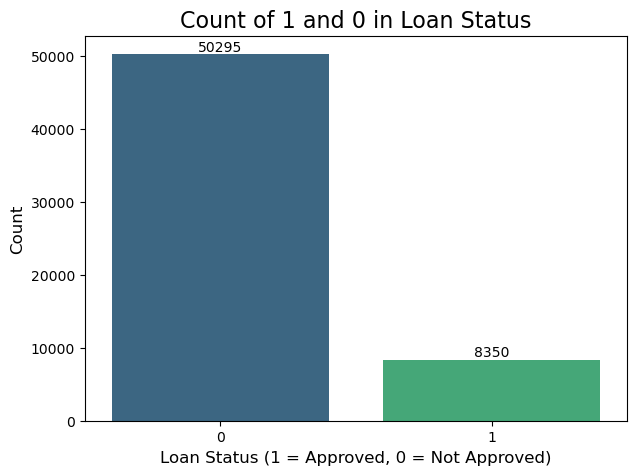

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the values in loan_status column (1s and 0s)
loan_status_counts = df_train['loan_status'].value_counts()

# Set figure size
plt.figure(figsize=(7, 5))

# Create a barplot using seaborn
sns.barplot(x=loan_status_counts.index, 
            y=loan_status_counts.values, 
            palette="viridis")

# Add labels for each bar
for index, value in enumerate(loan_status_counts.values):
    plt.text(index, value, f'{value}', ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title('Count of 1 and 0 in Loan Status', fontsize=16)
plt.xlabel('Loan Status (1 = Approved, 0 = Not Approved)', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Show the plot
plt.show()


In [23]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Importing essential libraries
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostClassifier
from sklearn.ensemble import VotingClassifier
from IPython.display import display, HTML

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
import random

# Suppress warnings for clarity
import warnings
warnings.filterwarnings("ignore")
# Set Seaborn color palette for the notebook
sns.set_palette("deep")
sns.set_theme(style="whitegrid", palette="deep")

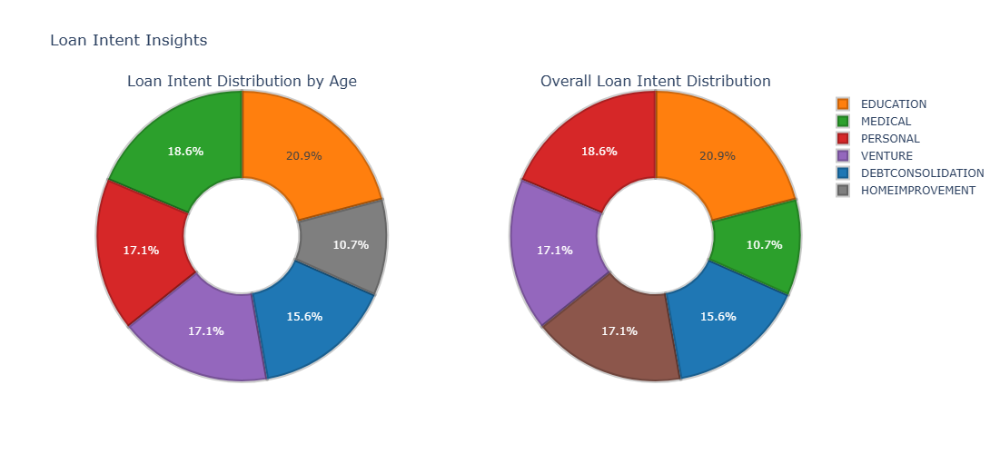

In [25]:
# Preparing data for the donut chart (loan intent by age)
loan_intent_age_distribution = df_train.groupby(['person_age', 'loan_intent']).size().reset_index(name='count')

# Create a combined string for hover data
loan_intent_age_distribution['hover_data'] = (
    loan_intent_age_distribution['person_age'].astype(str) + 
    " - " + loan_intent_age_distribution['loan_intent']
)

# Preparing data for the second donut chart (overall loan intent distribution)
overall_loan_intent_distribution = df_train.groupby('loan_intent').size().reset_index(name='count')

# Define a deep color palette
deep_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

# Create the donut chart for loan intent by age
donut_chart_age = go.Pie(
    labels=loan_intent_age_distribution['loan_intent'], 
    values=loan_intent_age_distribution['count'], 
    name="Loan Intent by Age",
    hole=0.4,  # Set hole size for donut chart
    marker=dict(
        line=dict(
            color='rgba(0, 0, 0, 0.2)',  # Shadow color
            width=4  # Width of the shadow effect
        ),
        colors=deep_colors  # Use the deep color palette
    ),
    hovertemplate=(
        "<b>Details:</b> %{customdata}<br>"  # Display combined age and loan intent
        "<b>Count:</b> %{value}<extra></extra>"  # Display count without extra hover box
    ),
    customdata=loan_intent_age_distribution['hover_data'].values  # Use combined data for custom hover
)

# Create the donut chart for overall loan intent distribution
donut_chart_overall = go.Pie(
    labels=overall_loan_intent_distribution['loan_intent'],
    values=overall_loan_intent_distribution['count'],
    name="Overall Loan Intent Distribution",
    hole=0.4,  # Set hole size for donut chart
    marker=dict(
        line=dict(
            color='rgba(0, 0, 0, 0.2)',  # Shadow color
            width=4  # Width of the shadow effect
        ),
        colors=deep_colors  # Use the same deep color palette
    ),
    hovertemplate=(
        "<b>Loan Intent:</b> %{label}<br>"   # Display loan intent
        "<b>Count:</b> %{value}<extra></extra>"  # Display count without extra hover box
    )
)

# Create subplots
fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'pie'}, {'type': 'pie'}]],
                    subplot_titles=("Loan Intent Distribution by Age", "Overall Loan Intent Distribution"))

# Add donut charts to the figure
fig.add_trace(donut_chart_age, row=1, col=1)
fig.add_trace(donut_chart_overall, row=1, col=2)

# Step 6: Update layout to increase figure size and position the legend
fig.update_layout(
    height=500, width=900,  # Set figure size
    showlegend=True,
    legend=dict(
        x=1,  # Place the legend outside
        y=1,
        traceorder="normal",
        font=dict(size=12)
    ),
    title="Loan Intent Insights"
)

# Display the figure
fig.show()


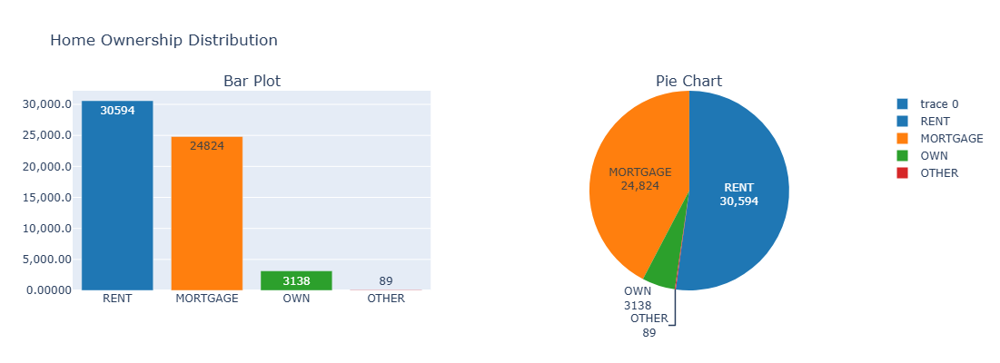

In [27]:
# Get counts of each category
home_ownership_counts = df_train['person_home_ownership'].value_counts().reset_index()
home_ownership_counts.columns = ['person_home_ownership', 'count']

# Define a deep color palette
deep_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']  # Add more colors if needed

# Create subplots with two columns, specifying the second column as a pie chart
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{"type": "bar"}, {"type": "pie"}]], 
                    subplot_titles=('Bar Plot', 'Pie Chart'))

# Add the bar trace
fig.add_trace(go.Bar(
    x=home_ownership_counts['person_home_ownership'],
    y=home_ownership_counts['count'],
    text=home_ownership_counts['count'],
    textposition='auto',
    marker=dict(color=deep_color_palette[:len(home_ownership_counts)]),  # Use the deep color palette
    hovertemplate='Home Ownership: %{x}<br>Count: %{y}<extra></extra>'  # Display column names on hover
), row=1, col=1)  # Bar plot in the first subplot

# Add the pie chart
fig.add_trace(go.Pie(
    labels=home_ownership_counts['person_home_ownership'],
    values=home_ownership_counts['count'],
    marker=dict(colors=deep_color_palette[:len(home_ownership_counts)]),  # Use the deep color palette
    hoverinfo='label+percent+value',
    textinfo='label+value',
    hovertemplate='Home Ownership: %{label}<br>Count: %{value}<br>Percent: %{percent:.2%}<extra></extra>'  # Display column names and percent on hover
), row=1, col=2)  # Pie chart in the second subplot

# Update layout for better visualization
fig.update_layout(
    title='Home Ownership Distribution',
    height=400,
    width=800,
    yaxis=dict(
        tickformat=',g',  # Use thousands separator without abbreviating
        showspikes=False  # Disable spikes
    )
)

# Show the figure
fig.show()


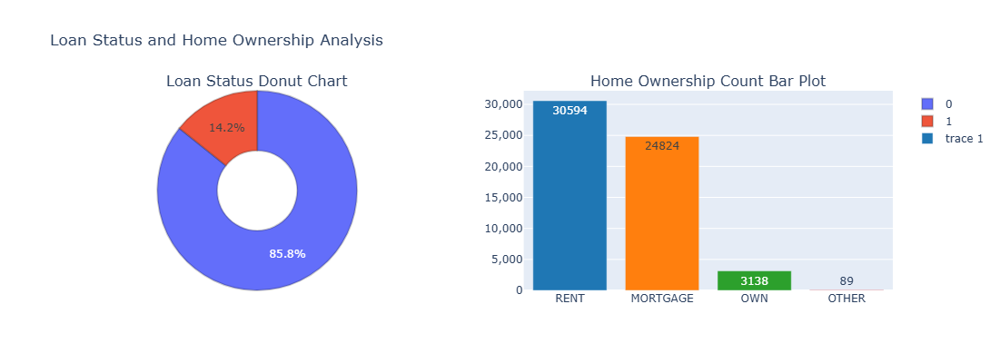

In [29]:
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'pie'}, {'type': 'bar'}]],
    subplot_titles=("Loan Status Donut Chart", "Home Ownership Count Bar Plot")
)

# Prepare data for the donut chart (loan_status)
loan_status_counts = df_train['loan_status'].value_counts().reset_index()
loan_status_counts.columns = ['loan_status', 'count']

# Prepare the donut chart
donut_chart = go.Pie(
    labels=loan_status_counts['loan_status'],
    values=loan_status_counts['count'],
    hole=0.4,  # Set hole size for donut chart
    marker=dict(line=dict(color='rgba(0, 0, 0, 0.2)', width=2))  # Add shadow effect
)

# Add the donut chart to the figure
fig.add_trace(donut_chart, row=1, col=1)

# Prepare data for the bar plot (person_home_ownership)
home_ownership_counts = df_train['person_home_ownership'].value_counts().reset_index()
home_ownership_counts.columns = ['person_home_ownership', 'count']

# Define a deep color palette
deep_color_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']  # More colors can be added if needed

# Add the bar trace
fig.add_trace(go.Bar(
    x=home_ownership_counts['person_home_ownership'],
    y=home_ownership_counts['count'],
    text=home_ownership_counts['count'],  # Display counts above bars
    textposition='auto',  # Automatically position the text
    marker=dict(color=deep_color_palette[:len(home_ownership_counts)])  # Use colors from the deep palette
), row=1, col=2)

# Update layout for better visualization
fig.update_layout(
    title='Loan Status and Home Ownership Analysis',
    height=400,
    width=900,
    showlegend=True,
    yaxis_tickformat=',',  # Use a comma as a thousands separator
)

# Show the figure
fig.show()


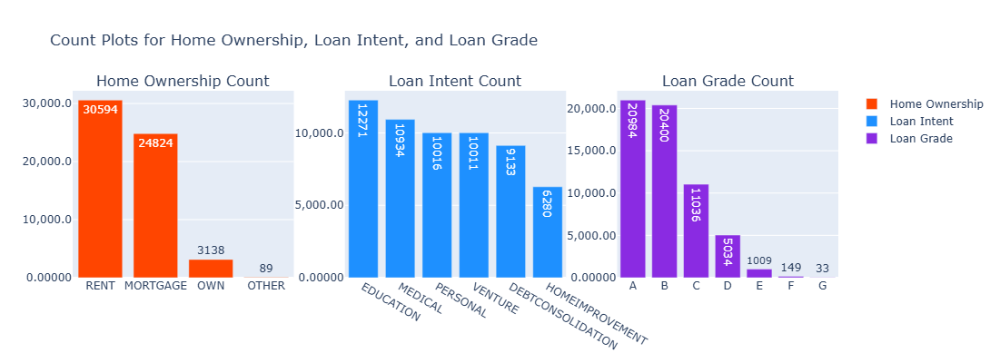

In [31]:
#  Create subplots 
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'bar'}, {'type': 'bar'}, {'type': 'bar'}]],
    subplot_titles=("Home Ownership Count", "Loan Intent Count", "Loan Grade Count")
)

# Prepare data for each column

# Count for person_home_ownership
home_ownership_counts = df_train['person_home_ownership'].value_counts().reset_index()
home_ownership_counts.columns = ['person_home_ownership', 'count']

# Define a deep color for home ownership
home_ownership_color = '#FF4500'  # OrangeRed

# Add the bar trace for home ownership
fig.add_trace(go.Bar(
    x=home_ownership_counts['person_home_ownership'],
    y=home_ownership_counts['count'],
    name='Home Ownership',  # Legend name
    marker=dict(color=home_ownership_color),
    text=home_ownership_counts['count'],  # Display counts above bars
    textposition='auto'  # Automatically position the text
), row=1, col=1)

# Count for loan_intent
loan_intent_counts = df_train['loan_intent'].value_counts().reset_index()
loan_intent_counts.columns = ['loan_intent', 'count']

# Define a deep color for loan intent
loan_intent_color = '#1E90FF'  # Dodger Blue

# Add the bar trace for loan intent
fig.add_trace(go.Bar(
    x=loan_intent_counts['loan_intent'],
    y=loan_intent_counts['count'],
    name='Loan Intent',  # Legend name
    marker=dict(color=loan_intent_color),
    text=loan_intent_counts['count'],  # Display counts above bars
    textposition='auto'  # Automatically position the text
), row=1, col=2)

# Count for loan_grade
loan_grade_counts = df_train['loan_grade'].value_counts().reset_index()
loan_grade_counts.columns = ['loan_grade', 'count']

# Define a deep color for loan grade
loan_grade_color = '#8A2BE2'  # BlueViolet

# Add the bar trace for loan grade
fig.add_trace(go.Bar(
    x=loan_grade_counts['loan_grade'],
    y=loan_grade_counts['count'],
    name='Loan Grade',  # Legend name
    marker=dict(color=loan_grade_color),
    text=loan_grade_counts['count'],  # Display counts above bars
    textposition='auto'  # Automatically position the text
), row=1, col=3)

# Update layout for better visualization
fig.update_layout(
    title='Count Plots for Home Ownership, Loan Intent, and Loan Grade',
    height=400,
    width=1200,
    showlegend=True,
)

# Update y-axis properties to display full numbers
for i in range(1, 4):
    fig.update_yaxes(
        tickformat=',g',  # Use thousands separator without abbreviating
        showspikes=False,  # Disable spikes on y-axis
        row=1, col=i  # Specify which subplot to update
    )

# Show the figure
fig.show()


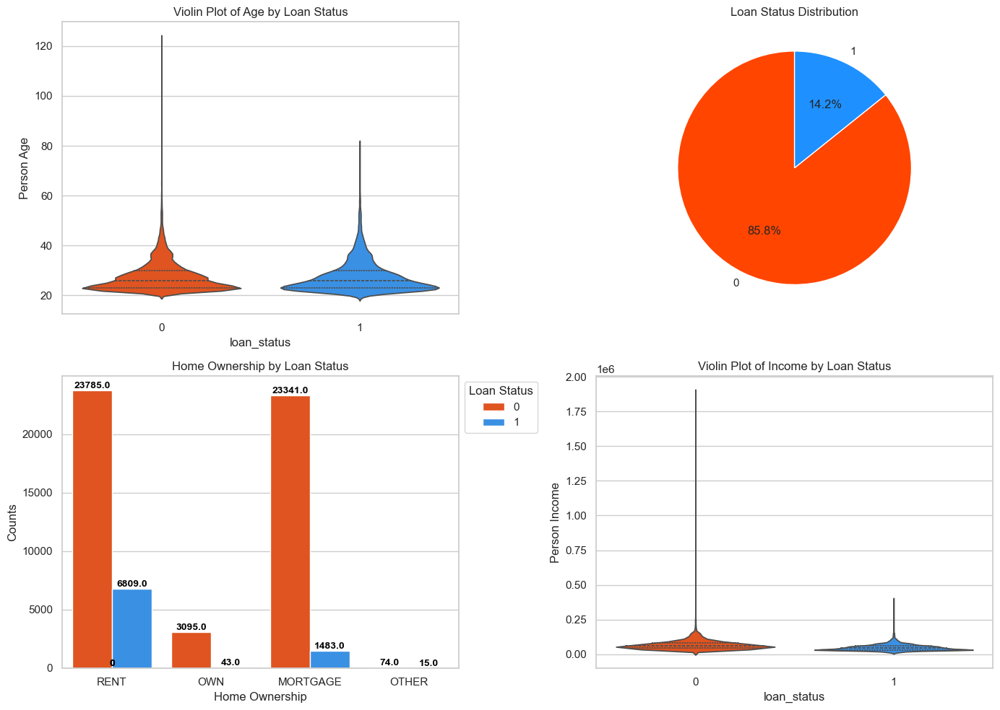

In [33]:
# Set the style for the plots
sns.set(style="whitegrid")

# Define a deeper color palette
colors = ['#FF4500', '#1E90FF', '#8A2BE2']  # Deep colors: OrangeRed, Dodger Blue, BlueViolet

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Violin plot for person_age
sns.violinplot(x='loan_status', y='person_age', data=df_train, ax=axs[0, 0], palette=colors[:2], inner="quartile")
axs[0, 0].set_title('Violin Plot of Age by Loan Status')
axs[0, 0].set_ylabel('Person Age')

# Pie chart for loan status
loan_counts = df_train['loan_status'].value_counts()
axs[0, 1].pie(loan_counts, labels=loan_counts.index, autopct='%1.1f%%', startangle=90, colors=colors[:2])
axs[0, 1].set_title('Loan Status Distribution')

# Count plot for person_home_ownership by loan status
sns.countplot(x='person_home_ownership', hue='loan_status', data=df_train, ax=axs[1, 0], palette=colors)
axs[1, 0].set_title('Home Ownership by Loan Status')
axs[1, 0].set_ylabel('Counts')
axs[1, 0].set_xlabel('Home Ownership')

# Add value annotations for count plot
for p in axs[1, 0].patches:
    axs[1, 0].annotate(f'{p.get_height()}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='bottom', 
                       color='black', size='small', weight='semibold')

# Violin plot for person_income
sns.violinplot(x='loan_status', y='person_income', data=df_train, ax=axs[1, 1], palette=colors[:2], inner="quartile")
axs[1, 1].set_title('Violin Plot of Income by Loan Status')
axs[1, 1].set_ylabel('Person Income')

# Adjust legend positions
axs[1, 0].legend(title='Loan Status', labels=loan_counts.index.tolist(), loc='upper left', bbox_to_anchor=(1, 1))

# Adjust layout
plt.tight_layout()
plt.show()


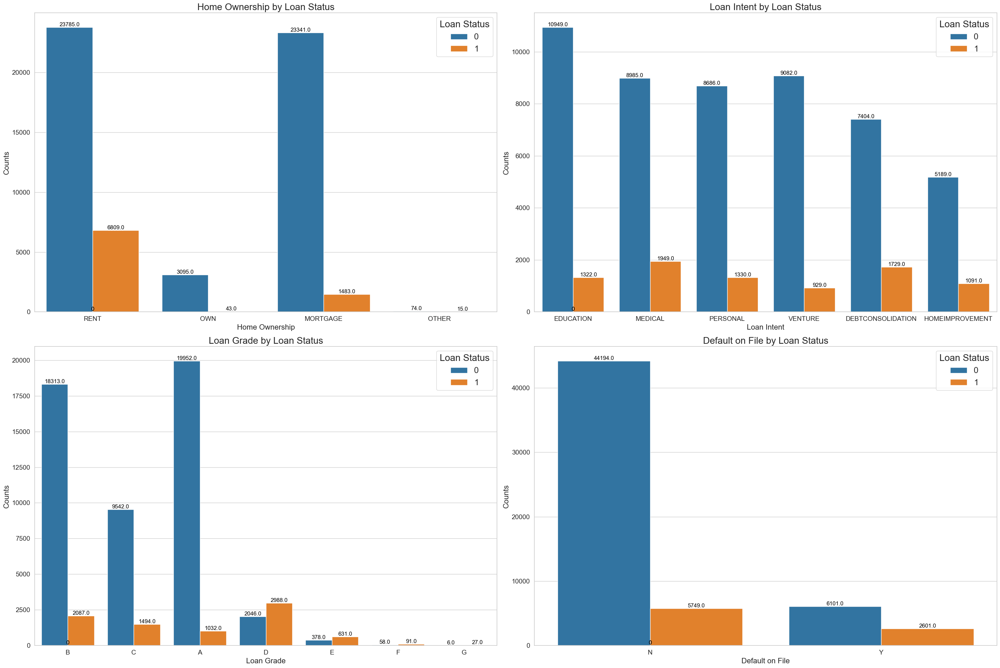

In [35]:
# Set the style for the plots
sns.set(style="whitegrid")

# Define a deeper color palette with rich tones
colors = ['#1F77B4', '#FF7F0E']  # Deep blue and deep orange

# Create a figure with subplots, increasing the figsize
fig, axs = plt.subplots(2, 2, figsize=(30, 20))  # Adjusted size for prominence

# Count plot for person_home_ownership by loan_status
sns.countplot(x='person_home_ownership', hue='loan_status', data=df_train, ax=axs[0, 0], palette=colors)
axs[0, 0].set_title('Home Ownership by Loan Status', fontsize=20)
axs[0, 0].set_ylabel('Counts', fontsize=16)
axs[0, 0].set_xlabel('Home Ownership', fontsize=16)
axs[0, 0].tick_params(labelsize=14)  # Adjust tick label size

# Add value annotations for person_home_ownership count plot
for p in axs[0, 0].patches:
    axs[0, 0].annotate(f'{p.get_height()}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='bottom', 
                       color='black', size='medium')

# Count plot for loan_intent by loan_status
sns.countplot(x='loan_intent', hue='loan_status', data=df_train, ax=axs[0, 1], palette=colors)
axs[0, 1].set_title('Loan Intent by Loan Status', fontsize=20)
axs[0, 1].set_ylabel('Counts', fontsize=16)
axs[0, 1].set_xlabel('Loan Intent', fontsize=16)
axs[0, 1].tick_params(labelsize=14)  # Adjust tick label size

# Add value annotations for loan_intent count plot
for p in axs[0, 1].patches:
    axs[0, 1].annotate(f'{p.get_height()}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='bottom', 
                       color='black', size='medium')

# Count plot for loan_grade by loan_status
sns.countplot(x='loan_grade', hue='loan_status', data=df_train, ax=axs[1, 0], palette=colors)
axs[1, 0].set_title('Loan Grade by Loan Status', fontsize=20)
axs[1, 0].set_ylabel('Counts', fontsize=16)
axs[1, 0].set_xlabel('Loan Grade', fontsize=16)
axs[1, 0].tick_params(labelsize=14)  # Adjust tick label size

# Add value annotations for loan_grade count plot
for p in axs[1, 0].patches:
    axs[1, 0].annotate(f'{p.get_height()}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='bottom', 
                       color='black', size='medium')

# Count plot for cb_person_default_on_file by loan_status
sns.countplot(x='cb_person_default_on_file', hue='loan_status', data=df_train, ax=axs[1, 1], palette=colors)
axs[1, 1].set_title('Default on File by Loan Status', fontsize=20)
axs[1, 1].set_ylabel('Counts', fontsize=16)
axs[1, 1].set_xlabel('Default on File', fontsize=16)
axs[1, 1].tick_params(labelsize=14)  # Adjust tick label size

# Add value annotations for cb_person_default_on_file count plot
for p in axs[1, 1].patches:
    axs[1, 1].annotate(f'{p.get_height()}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='bottom', 
                       color='black', size='medium')

# Adjust legends
for ax in axs.flat:
    ax.legend(title='Loan Status', fontsize=18, title_fontsize=20)

# Adjust layout
plt.tight_layout()
plt.show()


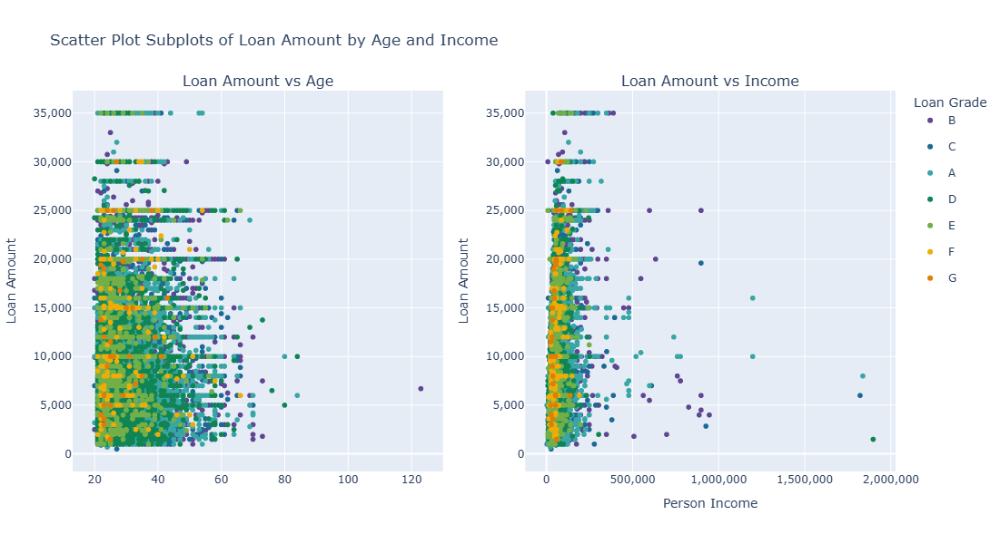

In [37]:
# Create scatter plots with Plotly Express
scatter_age = px.scatter(df_train, x='person_age', y='loan_amnt', color='loan_grade', 
                         title='Loan Amount vs Age Colored by Loan Grade',
                         labels={'person_age': 'Person Age', 'loan_amnt': 'Loan Amount'},
                         color_discrete_sequence=px.colors.qualitative.Prism)

scatter_income = px.scatter(df_train, x='person_income', y='loan_amnt', color='loan_grade', 
                            title='Loan Amount vs Income Colored by Loan Grade',
                            labels={'person_income': 'Person Income', 'loan_amnt': 'Loan Amount'},
                            color_discrete_sequence=px.colors.qualitative.Prism)

# Set up a subplot with 1 row and 2 columns
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=('Loan Amount vs Age', 'Loan Amount vs Income'))

# Add the scatter plots to the subplot figure
# For the first subplot, we keep the legend
for trace in scatter_age['data']:
    fig.add_trace(trace, row=1, col=1)

# For the second subplot, we hide the legend by setting `showlegend=False`
for trace in scatter_income['data']:
    trace.showlegend = False  # Disable legend for the second plot
    fig.add_trace(trace, row=1, col=2)

# Update layout for the overall figure
fig.update_layout(
    title_text="Scatter Plot Subplots of Loan Amount by Age and Income",
    showlegend=True,  # Display legend only once
    legend_title="Loan Grade",
    height=600, width=1200
)

# Ensure y-axis values show full numbers (e.g., 10000 instead of 10k)
fig.update_yaxes(tickformat=",", title_text="Loan Amount", row=1, col=1)  # First subplot
fig.update_yaxes(tickformat=",", title_text="Loan Amount", row=1, col=2)  # Second subplot

# Ensure x-axis values show full numbers for the second subplot (Loan Amount vs Income)
fig.update_xaxes(tickformat=",", title_text="Person Income", row=1, col=2)  # Second subplot

fig.show()


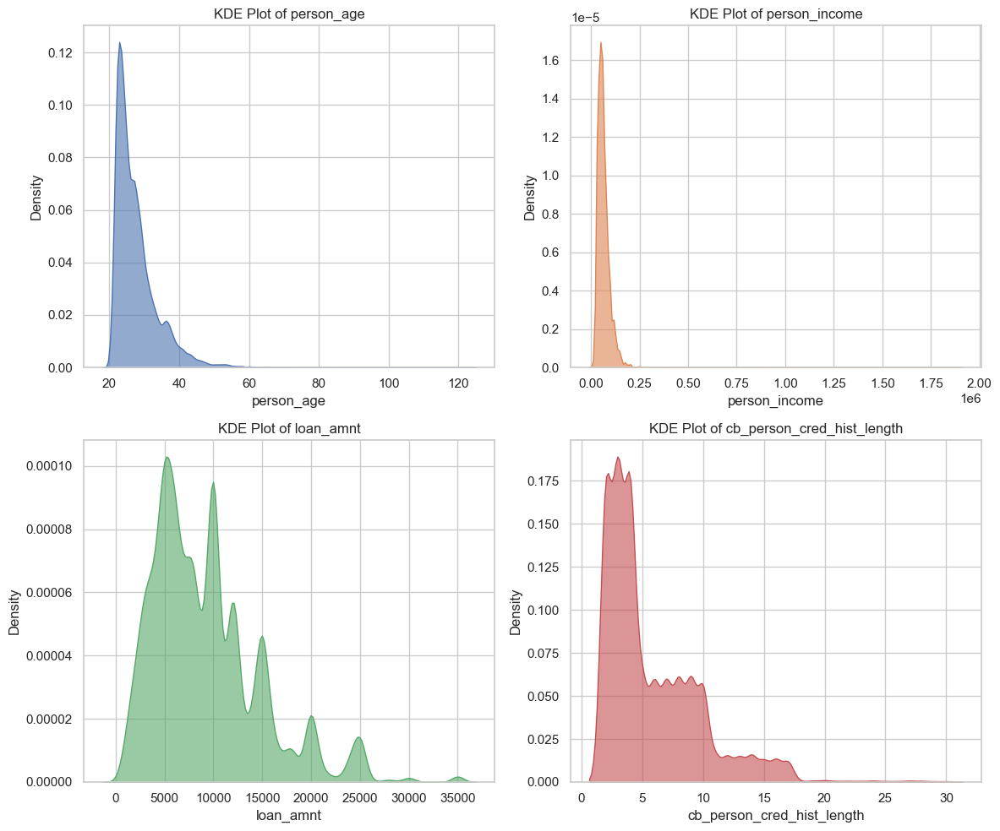

In [39]:
# Define the columns for which you want to create KDE plots
columns = ['person_age', 'person_income', 'loan_amnt', 'cb_person_cred_hist_length']

# Set a deep color palette
deep_palette = sns.color_palette("deep", len(columns))

# Create a figure with subplots
plt.figure(figsize=(12, 10))

# Loop through the columns and create a KDE plot for each
for i, column in enumerate(columns):
    plt.subplot(2, 2, i + 1)  # Create a 2x2 grid of subplots
    sns.kdeplot(data=df_train[column], fill=True, color=deep_palette[i], alpha=0.6)  # Create the KDE plot with a specific color
    plt.title(f'KDE Plot of {column}')  # Set the title for each subplot
    plt.xlabel(column)  # Label the x-axis
    plt.ylabel('Density')  # Label the y-axis

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()


In [290]:
# Create new features for df_train

# 1. Income to Loan Ratio
df_train['income_loan_ratio'] = df_train['person_income'] / df_train['loan_amnt']

# 2. Age-Employment Length Ratio
df_train['age_emp_length_ratio'] = df_train['person_emp_length'] / df_train['person_age']

# # 3. Loan to Employment Ratio
# df_train['loan_emp_ratio'] = df_train['loan_amnt'] / df_train['person_emp_length']

# 4. Loan Interest to Income Ratio
df_train['loan_int_income_ratio'] = df_train['loan_int_rate'] / df_train['person_income']

# 5. Credit History to Age Ratio
df_train['cred_hist_age_ratio'] = df_train['cb_person_cred_hist_length'] / df_train['person_age']

# # 6. Loan Percent of Income per Year of Employment
# df_train['loan_percent_emp_year'] = df_train['loan_percent_income'] / df_train['person_emp_length']

# 7. Default Risk Index
df_train['default_risk_index'] = (df_train['loan_amnt'] * df_train['loan_int_rate']) / \
                                  (df_train['person_income'] * df_train['cb_person_cred_hist_length'])

# 8. Employment Stability Indicator
df_train['emp_stability_indicator'] = df_train.apply(lambda row: 1 if row['person_emp_length'] > (row['person_age'] * 0.6) else 0, axis=1)

# 9. Debt to Credit History Ratio
df_train['debt_cred_hist_ratio'] = df_train['loan_amnt'] / df_train['cb_person_cred_hist_length']

# Now repeat the same for df_test
# Ensure the 'loan_amnt', 'person_income', etc. columns are present in df_test

# 1. Income to Loan Ratio
df_test['income_loan_ratio'] = df_test['person_income'] / df_test['loan_amnt']

# 2. Age-Employment Length Ratio
df_test['age_emp_length_ratio'] = df_test['person_emp_length'] / df_test['person_age']

# # 3. Loan to Employment Ratio
# df_test['loan_emp_ratio'] = df_test['loan_amnt'] / df_test['person_emp_length']

# 4. Loan Interest to Income Ratio
df_test['loan_int_income_ratio'] = df_test['loan_int_rate'] / df_test['person_income']

# 5. Credit History to Age Ratio
df_test['cred_hist_age_ratio'] = df_test['cb_person_cred_hist_length'] / df_test['person_age']

# # 6. Loan Percent of Income per Year of Employment
# df_test['loan_percent_emp_year'] = df_test['loan_percent_income'] / df_test['person_emp_length']

# 7. Default Risk Index
df_test['default_risk_index'] = (df_test['loan_amnt'] * df_test['loan_int_rate']) / \
                                  (df_test['person_income'] * df_test['cb_person_cred_hist_length'])

# 8. Employment Stability Indicator
df_test['emp_stability_indicator'] = df_test.apply(lambda row: 1 if row['person_emp_length'] > (row['person_age'] * 0.6) else 0, axis=1)

# 9. Debt to Credit History Ratio
df_test['debt_cred_hist_ratio'] = df_test['loan_amnt'] / df_test['cb_person_cred_hist_length']

# Display the updated df_test dataframe with new features
df_test


,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,income_loan_ratio,age_emp_length_ratio,loan_int_income_ratio,cred_hist_age_ratio,default_risk_index,emp_stability_indicator,debt_cred_hist_ratio
0,58645,23,69000,RENT,3.0,HOMEIMPROVEMENT,F,25000,15.76,0.36,N,2,2.760000,0.130435,0.000228,0.086957,2.855072,0,12500.000000
1,58646,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4,9.600000,0.230769,0.000132,0.153846,0.330208,0,2500.000000
2,58647,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2,7.500000,0.192308,0.000573,0.076923,1.146000,0,2000.000000
3,58648,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7,7.142857,0.121212,0.000178,0.212121,0.178000,0,1000.000000
4,58649,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4,6.800000,0.307692,0.000160,0.153846,0.600000,0,3750.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39093,97738,22,31200,MORTGAGE,2.0,DEBTCONSOLIDATION,B,3000,10.37,0.10,N,4,10.400000,0.090909,0.000332,0.181818,0.249279,0,750.000000
39094,97739,22,48000,MORTGAGE,6.0,EDUCATION,A,7000,6.03,0.15,N,3,6.857143,0.272727,0.000126,0.136364,0.293125,0,2333.333333
39095,97740,51,60000,MORTGAGE,0.0,PERSONAL,A,15000,7.51,0.25,N,25,4.000000,0.000000,0.000125,0.490196,0.075100,0,600.000000
39096,97741,22,36000,MORTGAGE,4.0,PERSONAL,D,14000,15.62,0.39,Y,4,2.571429,0.181818,0.000434,0.181818,1.518611,0,3500.000000


In [291]:
df_train.drop(columns=['id'], inplace=True)
df_test_ids = df_test['id']  
df_test.drop(columns=['id'], inplace=True)

In [292]:
# One-Hot Encoding
df_train = pd.get_dummies(df_train, columns=['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file'], drop_first=True)
df_test = pd.get_dummies(df_test, columns=['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file'], drop_first=True)

In [293]:
df_train

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status,income_loan_ratio,age_emp_length_ratio,...,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_Y
0,37,35000,0.0,6000,11.49,0.17,14,0,5.833333,0.000000,...,False,False,False,True,False,False,False,False,False,False
1,22,56000,6.0,4000,13.35,0.07,2,0,14.000000,0.272727,...,True,False,False,False,True,False,False,False,False,False
2,29,28800,8.0,6000,8.90,0.21,10,0,4.800000,0.275862,...,False,True,False,False,False,False,False,False,False,False
3,30,70000,14.0,12000,11.11,0.17,5,0,5.833333,0.466667,...,False,False,True,True,False,False,False,False,False,False
4,22,60000,2.0,6000,6.92,0.10,3,0,10.000000,0.090909,...,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,5.0,25000,15.95,0.21,10,0,4.800000,0.147059,...,False,False,False,False,False,True,False,False,False,True
58641,28,28800,0.0,10000,12.73,0.35,8,1,2.880000,0.000000,...,True,False,False,False,True,False,False,False,False,False
58642,23,44000,7.0,6800,16.00,0.15,2,1,6.470588,0.304348,...,False,False,False,False,False,True,False,False,False,False
58643,22,30000,2.0,5000,8.90,0.17,3,0,6.000000,0.090909,...,False,False,False,False,False,False,False,False,False,False


In [294]:
df_train[df_train.select_dtypes(include='bool').columns] = df_train.select_dtypes(include='bool').astype(int)
df_test[df_test.select_dtypes(include='bool').columns] = df_test.select_dtypes(include='bool').astype(int)

In [295]:
df_train

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status,income_loan_ratio,age_emp_length_ratio,...,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_Y
0,37,35000,0.0,6000,11.49,0.17,14,0,5.833333,0.000000,...,0,0,0,1,0,0,0,0,0,0
1,22,56000,6.0,4000,13.35,0.07,2,0,14.000000,0.272727,...,1,0,0,0,1,0,0,0,0,0
2,29,28800,8.0,6000,8.90,0.21,10,0,4.800000,0.275862,...,0,1,0,0,0,0,0,0,0,0
3,30,70000,14.0,12000,11.11,0.17,5,0,5.833333,0.466667,...,0,0,1,1,0,0,0,0,0,0
4,22,60000,2.0,6000,6.92,0.10,3,0,10.000000,0.090909,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,5.0,25000,15.95,0.21,10,0,4.800000,0.147059,...,0,0,0,0,0,1,0,0,0,1
58641,28,28800,0.0,10000,12.73,0.35,8,1,2.880000,0.000000,...,1,0,0,0,1,0,0,0,0,0
58642,23,44000,7.0,6800,16.00,0.15,2,1,6.470588,0.304348,...,0,0,0,0,0,1,0,0,0,0
58643,22,30000,2.0,5000,8.90,0.17,3,0,6.000000,0.090909,...,0,0,0,0,0,0,0,0,0,0


In [296]:
numerical_cols_train = df_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
print("Numerical columns in df_train:")
print(numerical_cols_train)

Numerical columns in df_train:
['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'loan_status', 'income_loan_ratio', 'age_emp_length_ratio', 'loan_int_income_ratio', 'cred_hist_age_ratio', 'default_risk_index', 'emp_stability_indicator', 'debt_cred_hist_ratio']


In [297]:
# Check for NaN values in df_train and df_test
print("NaN values in df_train:")
print(df_train.isna().sum())

print("NaN values in df_test:")
print(df_test.isna().sum())

# Check for infinite values in df_train and df_test
print("Infinite values in df_train:")
print(np.isinf(df_train).sum())

print("Infinite values in df_test:")
print(np.isinf(df_test).sum())


NaN values in df_train:
person_age                     0
person_income                  0
person_emp_length              0
loan_amnt                      0
loan_int_rate                  0
loan_percent_income            0
cb_person_cred_hist_length     0
loan_status                    0
income_loan_ratio              0
age_emp_length_ratio           0
loan_int_income_ratio          0
cred_hist_age_ratio            0
default_risk_index             0
emp_stability_indicator        0
debt_cred_hist_ratio           0
person_home_ownership_OTHER    0
person_home_ownership_OWN      0
person_home_ownership_RENT     0
loan_intent_EDUCATION          0
loan_intent_HOMEIMPROVEMENT    0
loan_intent_MEDICAL            0
loan_intent_PERSONAL           0
loan_intent_VENTURE            0
loan_grade_B                   0
loan_grade_C                   0
loan_grade_D                   0
loan_grade_E                   0
loan_grade_F                   0
loan_grade_G                   0
cb_person_default_o

In [298]:
# # Replace infinite values with NaN in both training and test data
# df_train.replace([np.inf, -np.inf], np.nan, inplace=True)
# df_test.replace([np.inf, -np.inf], np.nan, inplace=True)

# # Replace NaN values with the median value of each column
# # For df_train
# for column in df_train.columns:
#     if df_train[column].dtype != 'object':  # Only apply to numerical columns
#         median_value = df_train[column].median()
#         df_train[column].fillna(median_value, inplace=True)

# # For df_test
# for column in df_test.columns:
#     if df_test[column].dtype != 'object':  # Only apply to numerical columns
#         median_value = df_test[column].median()
#         df_test[column].fillna(median_value, inplace=True)

# # After this, you can proceed with your model training and prediction



In [299]:
# Train and Test Data Missing Values
print(df_train.isnull().sum())
print(df_test.isnull().sum())

person_age                     0
person_income                  0
person_emp_length              0
loan_amnt                      0
loan_int_rate                  0
loan_percent_income            0
cb_person_cred_hist_length     0
loan_status                    0
income_loan_ratio              0
age_emp_length_ratio           0
loan_int_income_ratio          0
cred_hist_age_ratio            0
default_risk_index             0
emp_stability_indicator        0
debt_cred_hist_ratio           0
person_home_ownership_OTHER    0
person_home_ownership_OWN      0
person_home_ownership_RENT     0
loan_intent_EDUCATION          0
loan_intent_HOMEIMPROVEMENT    0
loan_intent_MEDICAL            0
loan_intent_PERSONAL           0
loan_intent_VENTURE            0
loan_grade_B                   0
loan_grade_C                   0
loan_grade_D                   0
loan_grade_E                   0
loan_grade_F                   0
loan_grade_G                   0
cb_person_default_on_file_Y    0
dtype: int

In [300]:
# Rescaling the relevant numerical features in both training and test sets
scaler = MinMaxScaler()
num_vars_train = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'income_loan_ratio', 'age_emp_length_ratio', 'loan_int_income_ratio', 'cred_hist_age_ratio', 'default_risk_index', 'emp_stability_indicator', 'debt_cred_hist_ratio']
num_vars_test = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'income_loan_ratio', 'age_emp_length_ratio', 'loan_int_income_ratio', 'cred_hist_age_ratio', 'default_risk_index', 'emp_stability_indicator', 'debt_cred_hist_ratio']
df_train[num_vars_train] = scaler.fit_transform(df_train[num_vars_train])
df_test[num_vars_test] = scaler.transform(df_test[num_vars_test])
from sklearn.preprocessing import StandardScaler

# # Initialize the scaler
# scaler = StandardScaler()

# # List of numerical columns for training and testing sets
# num_vars_train = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'income_loan_ratio', 'age_emp_length_ratio', 'loan_int_income_ratio', 'cred_hist_age_ratio', 'default_risk_index', 'emp_stability_indicator', 'debt_cred_hist_ratio']
# num_vars_test = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'income_loan_ratio', 'age_emp_length_ratio', 'loan_int_income_ratio', 'cred_hist_age_ratio', 'default_risk_index', 'emp_stability_indicator', 'debt_cred_hist_ratio']

# # Standardize the numerical columns in both training and test sets
# df_train[num_vars_train] = scaler.fit_transform(df_train[num_vars_train])
# df_test[num_vars_test] = scaler.transform(df_test[num_vars_test])

# # Display the first few rows to confirm the changes
# df_train.head()


In [301]:
# Train and Test Data Missing Values
print(df_train.isnull().sum())
print(df_test.isnull().sum())

person_age                     0
person_income                  0
person_emp_length              0
loan_amnt                      0
loan_int_rate                  0
loan_percent_income            0
cb_person_cred_hist_length     0
loan_status                    0
income_loan_ratio              0
age_emp_length_ratio           0
loan_int_income_ratio          0
cred_hist_age_ratio            0
default_risk_index             0
emp_stability_indicator        0
debt_cred_hist_ratio           0
person_home_ownership_OTHER    0
person_home_ownership_OWN      0
person_home_ownership_RENT     0
loan_intent_EDUCATION          0
loan_intent_HOMEIMPROVEMENT    0
loan_intent_MEDICAL            0
loan_intent_PERSONAL           0
loan_intent_VENTURE            0
loan_grade_B                   0
loan_grade_C                   0
loan_grade_D                   0
loan_grade_E                   0
loan_grade_F                   0
loan_grade_G                   0
cb_person_default_on_file_Y    0
dtype: int

In [302]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 30 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   person_age                   58645 non-null  float64
 1   person_income                58645 non-null  float64
 2   person_emp_length            58645 non-null  float64
 3   loan_amnt                    58645 non-null  float64
 4   loan_int_rate                58645 non-null  float64
 5   loan_percent_income          58645 non-null  float64
 6   cb_person_cred_hist_length   58645 non-null  float64
 7   loan_status                  58645 non-null  int64  
 8   income_loan_ratio            58645 non-null  float64
 9   age_emp_length_ratio         58645 non-null  float64
 10  loan_int_income_ratio        58645 non-null  float64
 11  cred_hist_age_ratio          58645 non-null  float64
 12  default_risk_index           58645 non-null  float64
 13  emp_stability_in

In [303]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 29 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   person_age                   39098 non-null  float64
 1   person_income                39098 non-null  float64
 2   person_emp_length            39098 non-null  float64
 3   loan_amnt                    39098 non-null  float64
 4   loan_int_rate                39098 non-null  float64
 5   loan_percent_income          39098 non-null  float64
 6   cb_person_cred_hist_length   39098 non-null  float64
 7   income_loan_ratio            39098 non-null  float64
 8   age_emp_length_ratio         39098 non-null  float64
 9   loan_int_income_ratio        39098 non-null  float64
 10  cred_hist_age_ratio          39098 non-null  float64
 11  default_risk_index           39098 non-null  float64
 12  emp_stability_indicator      39098 non-null  float64
 13  debt_cred_hist_r

In [304]:
# Prepare the training and validation data
X_train = df_train.drop('loan_status', axis=1)  # Features
y_train = df_train['loan_status']  # Target

In [305]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [306]:
# #Handle Imbalance using SMOTE for oversampling the minority class
# smote = SMOTE(random_state=42)
# X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [307]:
X_resampled

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,income_loan_ratio,age_emp_length_ratio,loan_int_income_ratio,...,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_Y
0,0.155340,0.024159,0.000000,0.194203,0.473596,0.168675,0.464286,0.005231,0.000000,0.104558,...,0,0,0,0,1,0,0,0,0,1
1,0.067961,0.020572,0.024390,0.130435,0.350562,0.144578,0.250000,0.006570,0.018970,0.101838,...,0,0,0,0,1,0,0,0,0,1
2,0.048544,0.034708,0.000000,0.217391,0.138202,0.132530,0.035714,0.006657,0.000000,0.041502,...,0,0,0,0,0,0,0,0,0,0
3,0.184466,0.037346,0.016260,0.420290,0.062921,0.240964,0.321429,0.003696,0.008755,0.031773,...,0,0,0,0,0,0,0,0,0,0
4,0.019417,0.021838,0.040650,0.101449,0.125843,0.108434,0.000000,0.008750,0.038803,0.062752,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80411,0.044037,0.032021,0.018776,0.663220,0.241431,0.455104,0.000000,0.001932,0.016348,0.056861,...,0,0,0,1,0,0,0,0,0,0
80412,0.031521,0.050436,0.035475,0.289970,0.548212,0.128152,0.013452,0.007475,0.031041,0.058423,...,0,0,0,0,0,1,0,0,0,1
80413,0.116505,0.047708,0.069322,0.420290,0.628559,0.192771,0.250000,0.004730,0.045493,0.065648,...,0,0,0,0,0,1,0,0,0,1
80414,0.097087,0.026870,0.008384,0.130989,0.492537,0.108622,0.142300,0.008425,0.005869,0.097019,...,0,0,0,0,1,0,0,0,0,0


In [308]:
# # Initialize the Random Forest model
# rf_model = RandomForestClassifier(random_state=42)

# # Train the model on the resampled data
# rf_model.fit(X_resampled, y_resampled)

# # Predict on the validation set
# y_pred = rf_model.predict(X_test)

# # Calculate the accuracy
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")

# # Print the classification report for more detailed performance analysis
# print(classification_report(y_test, y_pred))

Accuracy: 0.94
              precision    recall  f1-score   support

           0       0.96      0.97      0.97     10087
           1       0.81      0.75      0.78      1642

    accuracy                           0.94     11729
   macro avg       0.89      0.86      0.87     11729
weighted avg       0.94      0.94      0.94     11729



In [309]:

# test_predictions = rf_model.predict(df_test)

# # Create a DataFrame with test IDs and predictions
# output = pd.DataFrame({
#     'id': df_test_ids,  # Use the test IDs from earlier
#     'loan_status': test_predictions  # Predictions from the model
# })

# # Export the results to an Excel file
# output.to_excel('loan_status_predictions.xlsx', index=False)

In [310]:
from catboost import CatBoostClassifier
catboost_model = CatBoostClassifier(random_state=42, verbose=0)

# Train the model on the resampled data
catboost_model.fit(X_resampled, y_resampled)

# Predict on the validation set (X_test)
y_pred = catboost_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"CatBoost Accuracy: {accuracy:.2f}")

# Print the classification report for detailed performance analysis
print(classification_report(y_test, y_pred))

# Optionally, you can save the model's predictions on the test dataset
test_predictions = catboost_model.predict(df_test)

# Create a DataFrame with test IDs and predictions
output = pd.DataFrame({
    'id': df_test_ids,
    'loan_status': test_predictions
})

# Export the predictions to an Excel file
output.to_excel('catboost_loan_status_predictions.xlsx', index=False)

CatBoost Accuracy: 0.95
              precision    recall  f1-score   support

           0       0.96      0.99      0.97     10087
           1       0.90      0.74      0.81      1642

    accuracy                           0.95     11729
   macro avg       0.93      0.87      0.89     11729
weighted avg       0.95      0.95      0.95     11729



In [311]:
print(f"Length of df_test_ids: {len(df_test_ids)}")
print(f"Length of test_predictions: {len(test_predictions)}")

Length of df_test_ids: 39098
Length of test_predictions: 39098


In [312]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import accuracy_score, classification_report


# Define the neural network model
model = Sequential()

# Input layer
model.add(Dense(128, activation='relu', input_shape=(X_resampled.shape[1],)))  # Adjust input shape based on your feature set
model.add(Dropout(0.3))  # Dropout layer to prevent overfitting

# Hidden layers
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(32, activation='relu'))
model.add(Dropout(0.3))

# Output layer (1 neuron with sigmoid activation for binary classification)
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_resampled, y_resampled, epochs=50, batch_size=32, validation_split=0.2)

# Predict on the test set
y_pred = (model.predict(X_test) > 0.5).astype("int32")

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Print the classification report for more detailed performance analysis
print(classification_report(y_test, y_pred))


Epoch 1/50


C:\Users\Dell\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2011/2011 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8056 - loss: 0.4359 - val_accuracy: 0.7586 - val_loss: 0.4776
Epoch 2/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8739 - loss: 0.3253 - val_accuracy: 0.7603 - val_loss: 0.4225
Epoch 3/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8772 - loss: 0.3139 - val_accuracy: 0.7690 - val_loss: 0.4131
Epoch 4/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.8819 - loss: 0.3077 - val_accuracy: 0.7605 - val_loss: 0.4052
Epoch 5/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8799 - loss: 0.3041 - val_accuracy: 0.7809 - val_loss: 0.3820
Epoch 6/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8810 - loss: 0.3046 - val_accuracy: 0.7507 - val_loss: 0.4524
Epoch 7/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8808 - loss: 0.2988 - val_accuracy: 0.7636 - val_loss: 0.4272
Epoch 8/50
2011/2011 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8812 - loss: 0.3005 - val_accurac

In [313]:
# Make predictions on the test set
test_predictions = model.predict(df_test)

# Flatten the predictions array if necessary
test_predictions = test_predictions.flatten()

# Create a DataFrame with test IDs and predictions
output = pd.DataFrame({
    'id': df_test_ids,
    'loan_status': test_predictions
})

# Export the predictions to an Excel file
output.to_excel('catboost_loan_status_predictions.xlsx', index=False)

1222/1222 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step
